In [7]:
# Import Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import plotly.express as px
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind, kstest
import statsmodels.api as sm

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
pd.set_option('display.max_colwidth', None)

In [8]:
# Load necessary datasets:
olist_geolocation_dataset = pd.read_csv('archive/olist_geolocation_dataset_city_cleaned_final_Jo.csv', delimiter=';')
olist_orders_dataset = pd.read_csv('archive/olist_orders_dataset.csv')
olist_customers_dataset = pd.read_csv('archive/olist_customers_dataset.csv')
olist_order_items_dataset = pd.read_csv('archive/olist_order_items_dataset.csv')
olist_order_payments_dataset = pd.read_csv('archive/olist_order_payments_dataset.csv')
olist_order_reviews_dataset = pd.read_csv('archive/olist_order_reviews_dataset.csv')
olist_products_dataset = pd.read_csv('archive/olist_products_dataset.csv')
olist_sellers_dataset = pd.read_csv('archive/olist_sellers_dataset.csv')
product_category_name_translation = pd.read_csv('archive/product_category_name_translation.csv')

# geolocation

In [9]:
olist_geolocation_dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [10]:
olist_geolocation_dataset.isna().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [11]:
olist_geolocation_dataset.duplicated().sum()

279749

In [12]:
new_geolocation = olist_geolocation_dataset.drop_duplicates()

In [13]:
new_geolocation.info()

<class 'pandas.core.frame.DataFrame'>
Index: 720414 entries, 0 to 1000161
Data columns (total 5 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   geolocation_zip_code_prefix  720414 non-null  int64  
 1   geolocation_lat              720414 non-null  float64
 2   geolocation_lng              720414 non-null  float64
 3   geolocation_city             720414 non-null  object 
 4   geolocation_state            720414 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 33.0+ MB


In [14]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(new_geolocation):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = new_geolocation.columns
    uniquedata ['Unique Count'] = [new_geolocation[col].nunique() for col in (new_geolocation.columns)]
    uniquedata ['Unique'] = [new_geolocation[col].unique() for col in (new_geolocation.columns)] 
    return uniquedata

unique_values(new_geolocation)

,Columns,Unique Count,Unique
0,geolocation_zip_code_prefix,19015,"[1037, 1046, 1041, 1035, 1012, 1047, 1013, 1029, 1011, 1032, 1014, 1039, 1024, 1009, 1020, 1043, 1050, 1045, 1007, 1005, 1017, 1019, 1027, 1033, 1006, 1034, 1042, 1040, 1026, 1036, 1048, 1002, 1031, 1022, 1008, 1010, 1003, 1001, 1015, 1038, 1016, 1049, 1021, 1018, 1044, 1030, 1025, 1004, 1023, 1028, 1155, 1122, 1150, 1123, 1139, 1153, 1104, 1136, 1130, 1103, 1156, 1151, 1140, 1120, 1106, 1124, 1131, 1121, 1141, 1125, 1102, 1127, 1137, 1135, 1138, 1128, 1109, 1132, 1108, 1107, 1154, 1152, 1134, 1144, 1129, 1105, 1126, 1142, 1133, 1101, 1189, 1202, 1230, 1221, 1217, 1243, 1203, 1214, 1257, 1231, ...]"
1,geolocation_lat,717349,"[-23.54562128115268, -23.54608112703553, -23.54612896641469, -23.5443921648681, -23.541577961711493, -23.547762303364262, -23.54627311241268, -23.546923208436723, -23.543769055769133, -23.547639550320632, -23.547325128224376, -23.53841810407414, -23.546435343326205, -23.54894598518944, -23.54518734081604, -23.54188300998332, -23.541389521053937, -23.54693540437998, -23.54588427921401, -23.545165891770928, -23.55223547100232, -23.546690486964888, -23.546656718016017, -23.549773516504185, -23.541593762969622, -23.54542953344108, -23.550392524842728, -23.5398418758395, -23.543539449073783, -23.549819091869107, -23.54670459977496, -23.55001091199737, -23.54532011933758, -23.552151883432384, -23.540774688874112, -23.5492954052167, -23.549009406053425, -23.548755593946588, -23.538301166801343, -23.54985418067981, -23.5471192492354, -23.54032130474925, -23.54569153926945, -23.54874766250217, -23.54119147654225, -23.552549496537548, -23.55052430835593, -23.54239162719593, -23.552482452132203, -23.54660531805078, -23.54487359810152, -23.542908915344253, -23.54599881709849, -23.54020455565808, -23.538670334439413, -23.54638197224308, -23.54505164917197, -23.540316757429707, -23.54639669248079, -23.54981334999131, -23.539494799586286, -23.539147179866543, -23.541700023861782, -23.54677476876936, -23.542925000621707, -23.547082268784923, -23.547448918662464, -23.54831797807146, -23.536156075768947, -23.547052131282804, -23.546453343326203, -23.536864121011018, -23.54130569969415, -23.537304315614183, -23.54498660505508, -23.54425493154535, -23.54634051373424, -23.547806958346342, -23.55253336164808, -23.54903244546711, -23.54230306549716, -23.547686322234377, -23.544667372468112, -23.549107326677785, -23.54929199999999, -23.53984025062037, -23.54631891978764, -23.54501365751052, -23.54694058084668, -23.53701970912921, -23.550449207051752, -23.548851827918533, -23.544826346129778, -23.5406861987132, -23.545341492094146, -23.546252957116764, -23.54186295323959, -23.542520789115148, -23.54676158651283, -23.54267967629909, ...]"
2,geolocation_lng,717613,"[-46.63929204800168, -46.64482029837157, -46.64295148361138, -46.63949930627844, -46.64160722329613, -46.63536053788448, -46.64122516971552, -46.6342636964915, -46.63427784085132, -46.63603162315495, -46.63418378613892, -46.634778375266734, -46.63383023397196, -46.63467113292871, -46.63785524104107, -46.63991946670314, -46.62989908781218, -46.63658792659698, -46.64316319124004, -46.643785796266464, -46.6284406588955, -46.6354469588072, -46.64078762115524, -46.64559900666509, -46.64189378810082, -46.63571531432852, -46.63730164071784, -46.63514797691531, -46.64057731057763, -46.63560588995324, -46.64033633250615, -46.63116636914989, -46.64406863434122, -46.63080224715792, -46.63551484303775, -46.63207469510652, -46.64281228183975, -46.642789203733535, -46.63076391104508, -46.643139396906825, -46.634232699405686, -46.636394815973325, -46.635866061486446, -46.64239136704376, -46.63499346058632, -46.63163152553523, -46.63669363835193, -46.63770927785183, -46.62938955675458, -46.641982174447385, -46.64030309449483, -46.63679724785041, -46.640834743407, -46.64414705704306, -46.62934557285476, -46.642893706619056, -46.64007245239201, -46.63735536871719, -46.64305934055624, -46.63035027254893, -46.63284391414975, -

In [15]:
display(new_geolocation.head(), new_geolocation.tail())

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
1000155,99965,-28.180655,-52.034367,agua santa,RS
1000156,99950,-28.072188,-52.011272,tapejara,RS
1000157,99950,-28.068864,-52.012964,tapejara,RS
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


In [16]:
geolocation_state = new_geolocation.groupby('geolocation_state').count().reset_index()
display(geolocation_state.head(), geolocation_state.tail())

,geolocation_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city
0,AC,1034,1034,1034,1034
1,AL,3326,3326,3326,3326
2,AM,1977,1977,1977,1977
3,AP,729,729,729,729
4,BA,27442,27442,27442,27442


,geolocation_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city
22,RS,47654,47654,47654,47654
23,SC,29377,29377,29377,29377
24,SE,2644,2644,2644,2644
25,SP,274633,274633,274633,274633
26,TO,2956,2956,2956,2956


In [17]:
geolocation_city = new_geolocation.groupby('geolocation_city').count().reset_index()
display(geolocation_city.head(), geolocation_city.tail())

,geolocation_city,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_state
0,abadia de goias,7,7,7,7
1,abadia dos dourados,21,21,21,21
2,abadiania,23,23,23,23
3,abaete,109,109,109,109
4,abaetetuba,125,125,125,125


,geolocation_city,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_state
5947,zabele,3,3,3,3
5948,zacarias,12,12,12,12
5949,ze doca,32,32,32,32
5950,zortea,11,11,11,11
5951,´teresopolis,1,1,1,1


# seller_dataset

In [18]:
olist_sellers_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [19]:
display(olist_sellers_dataset.head(), olist_sellers_dataset.tail())

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


,seller_id,seller_zip_code_prefix,seller_city,seller_state
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS
3094,9e25199f6ef7e7c347120ff175652c3b,12051,taubate,SP


In [20]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(olist_sellers_dataset):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = olist_sellers_dataset.columns
    uniquedata ['Unique Count'] = [olist_sellers_dataset[col].nunique() for col in (olist_sellers_dataset.columns)]
    uniquedata ['Unique'] = [olist_sellers_dataset[col].unique() for col in (olist_sellers_dataset.columns)] 
    return uniquedata

unique_values(olist_sellers_dataset)

,Columns,Unique Count,Unique
0,seller_id,3095,"[3442f8959a84dea7ee197c632cb2df15, d1b65fc7debc3361ea86b5f14c68d2e2, ce3ad9de960102d0677a81f5d0bb7b2d, c0f3eea2e14555b6faeea3dd58c1b1c3, 51a04a8a6bdcb23deccc82b0b80742cf, c240c4061717ac1806ae6ee72be3533b, e49c26c3edfa46d227d5121a6b6e4d37, 1b938a7ec6ac5061a66a3766e0e75f90, 768a86e36ad6aae3d03ee3c6433d61df, ccc4bbb5f32a6ab2b7066a4130f114e3, 8cb7c5ddf41f4d506eba76e9a4702a25, a7a9b880c49781da66651ccf4ba9ac38, 8bd0f31cf0a614c658f6763bd02dea69, 05a48cc8859962767935ab9087417fbb, 7b8e8ec35bad4b0ef7e3963650b0a87b, 1444c08e64d55fb3c25f0f09c07ffcf2, 166e8f1381e09651983c38b1f6f91c11, e38db885400cd35c71dfd162f2c1dbcf, d2e753bb80b7d4faa77483ed00edc8ca, f9ec7093df3a7b346b7bcf7864069ca3, 4e6015589b781adaa5ce7f1892d06bb1, 4cf490a58259286ada5ba8525ba9e84a, f7496d659ca9fdaf323c0aae84176632, 2ff97219cb8622eaf3cd89b7d9c09824, 8bd0e3abda539b9479c4b44a691be1ec, 2a1348e9addc1af5aaa619b1a3679d6b, 2078fe5066350e7d220c0ad3a3bbc6c1, 116ccb1a1604bc88e4d234a8c23f33de, 430315b7bb4b6e4b3c978f9dfa9b0558, 406822777a0b9eb5c50e442dd4cd3ec5, 4dbd95a08b31ede5c82d3f861cb1ce1a, e9e446d01bd10a97a8ffcfc4a3a20cb2, d52cbce9845184537284a23c3bc3da0e, d9a84e1403de8da0c3aa531d6d108ba6, 9c690ceacd5c66731bf443ea810195cb, 1f9ab4708f3056ede07124aad39a2554, 1961c3e1272bfeceb05d0b78b5bbfdaf, d3e7d37c0df9aef383f3f2a15b0dddfb, ec2e006556300a79a5a91e4876ab3a56, b2a6d334e2833acea353624840e25a0e, d3674f271c91f824f82d24d92011f669, 768de2a4fc06aacecb9a586ccc30746a, a81466620e46a6970b22ef40379fdfc9, 5c030029b5916fed0986310385ec9009, c0f783394e37cd9c9d7f5f81141450fa, c353f8fc0ce8344999f17d578eb69a5e, 8444e55c1f13cd5c179851e5ca5ebd00, 28a26ebce31d5918b181ede016fd693b, 41ab63a91b8b264e8c8780368bf1dd5b, 8759e7aedd644f487315e5860962f162, e546117ed9cafbc40239c0c78635c584, d71d863e5ef30d94e440c11be17dcd8f, 0c7533c71df861ec58ad7ff999ed0e8d, ef990a83bbea832f36ebe81376335aa8, 41e0fa5761c886a630994a55c12087e7, 0747d5bb69f0586cc869d8af4c50f93e, 7d294cf9a6a69dc6a0c3e540fff0e039, c89cf7c468a48af70aada384e722f9e2, b7ba853e9551f4558440881fd3e5c815, 13c2ed7698b3ca92dad49e849219da59, cbbd5ae8f53de5f5097cd8217b529e24, 02ecc2a19303f05e59ce133fd923fff7, c013e57c075a06e5b5c48ee03c525719, 55f7a3319d80f7fdf078b8f03e6725fe, 2d50d6282f8aa2257819a77bfaa0efe0, b7e1750c1157341d2abd0251e07c186b, b90e891671cffd9557f33a97dc523645, a416b6a846a11724393025641d4edd5e, 7e93a43ef30c4f03f38b393420bc753a, 5206cc4bc2297c833e6061c49bf9c43f, f410c8873029fcc3809b9df6d0b28914, ef506c96320abeedfb894c34db06f478, a13aaf2d2886ab9fb30fb9a920160b8f, 7299e27ed73d2ad986de7f7c77d919fa, 8a9260f2b0340411d6d2a56bcf4f7378, dedcab67899479e4ea5dcc4eba47f587, b2479f944e1b90cf8a5de1bbfde284d6, 7722b1df1b0e383e000397b2c11e3e19, 731ef20c231d9a7103a425e83fd91271, 78813699ffac347fe27dba345a5f1551, 3296662b1331dea51e744505065ae889, 411f3b52d857390502ee4e4d5ceabc2d, bba3293d6f5d5af2f415e004e8b93ae3, 4e7c18b98d84e05cbae3ff0ff03846c2, b56906f7fd1696e043f1bcce164c487b, d650b663c3b5f6fb392b6326366efa9a, 669ae81880e08f269a64487cfb287169, c2d70ce2c5d0a2eb75e78668236e6dc8, 674207551483fec113276b67b0d871ff, abe42c5d03695b4257b5c6cbf4e6784e, 1996942dc085d7773ba77a529b163cd0, 79b93a308a97792cf53ac75f46da00b5, 7cf4ea70955b00d6b3c22542598e2715, 63ffcb71394dd8ea3872ed9ffda17c74, 83353a83fd769dfafa4f21a72b15e3e5, cda598c48d7c614bc1cad7d8ff6f0010, d4910f1cdcfdabd48d6b316e395d4a23, 709e16e2b25c7474d980076c6bfc4806, 9dc79dd988ac42f4d56c340d7048420a, 276677b5d08786d5dce7c2149dcce48b, ...]"
1,seller_zip_code_prefix,2246,"[13023, 13844, 20031, 4195, 12914, 20920, 55325, 16304, 1529, 80310, 75110, 13530, 1222, 5372, 88705, 42738, 88780, 70740, 45810, 5138, 11440, 14910, 4156, 13320, 98910, 30494, 86707, 9850, 4857, 18500, 80210, 2261, 88495, 3562, 37650, 17602, 7241, 83050, 3445, 4133, 72233, 70645, 88730, 88075, 13416, 90850, 37584, 31950, 31555, 9251, 4705, 6144, 13270, 89214, 11446, 28990, 88390, 25730, 95500, 84010, 6544, 9121, 13568, 6056, 14940, 5741, 83010, 3702, 6429, 6192, 95076, 3569, 89207, 38440, 32180, 89258, 9715, 

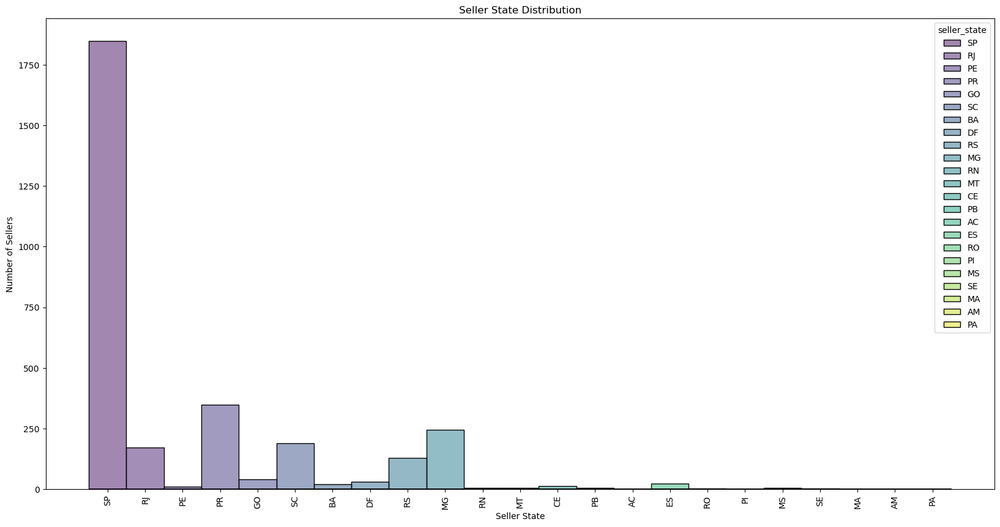

In [21]:
#seller location

plt.figure(figsize=(20,10))
sns.histplot(x='seller_state', data=olist_sellers_dataset, palette='viridis', hue='seller_state')
plt.title('Seller State Distribution')
plt.xlabel('Seller State')
plt.ylabel('Number of Sellers')
plt.xticks(rotation=90)
plt.show()

In [22]:
count_seller_city = olist_sellers_dataset.groupby('seller_city')['seller_id'].count().sort_values(ascending=False).reset_index()
display(count_seller_city.head(), count_seller_city.tail())

,seller_city,seller_id
0,sao paulo,694
1,curitiba,127
2,rio de janeiro,96
3,belo horizonte,68
4,ribeirao preto,52


,seller_city,seller_id
606,ivoti,1
607,itirapina,1
608,itau de minas,1
609,itapui,1
610,xaxim,1


# customer_data_set

In [23]:
olist_customers_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [24]:
display(olist_customers_dataset.head(), olist_customers_dataset.tail())

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS
99440,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP


In [25]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(olist_customers_dataset):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = olist_customers_dataset.columns
    uniquedata ['Unique Count'] = [olist_customers_dataset[col].nunique() for col in (olist_customers_dataset.columns)]
    uniquedata ['Unique'] = [olist_customers_dataset[col].unique() for col in (olist_customers_dataset.columns)] 
    return uniquedata

unique_values(olist_customers_dataset)

,Columns,Unique Count,Unique
0,customer_id,99441,"[06b8999e2fba1a1fbc88172c00ba8bc7, 18955e83d337fd6b2def6b18a428ac77, 4e7b3e00288586ebd08712fdd0374a03, b2b6027bc5c5109e529d4dc6358b12c3, 4f2d8ab171c80ec8364f7c12e35b23ad, 879864dab9bc3047522c92c82e1212b8, fd826e7cf63160e536e0908c76c3f441, 5e274e7a0c3809e14aba7ad5aae0d407, 5adf08e34b2e993982a47070956c5c65, 4b7139f34592b3a31687243a302fa75b, 9fb35e4ed6f0a14a4977cd9aea4042bb, 5aa9e4fdd4dfd20959cad2d772509598, b2d1536598b73a9abd18e0d75d92f0a3, eabebad39a88bb6f5b52376faec28612, 1f1c7bf1c9b041b292af6c1c4470b753, 206f3129c0e4d7d0b9550426023f0a08, a7c125a0a07b75146167b7f04a7f8e98, c5c61596a3b6bd0cee5766992c48a9a1, 9b8ce803689b3562defaad4613ef426f, 49d0ea0986edde72da777f15456a0ee0, 154c4ded6991bdfa3cd249d11abf4130, 690172ab319622688d3b4df42f676898, 2938121a40a20953c43caa8c98787fcb, 237098a64674ae89babdc426746260fc, cb721d7b4f271fd87011c4c83462c076, f681356046d9fde60e70c73a18d65ea2, 167bd30a409e3e4127df5a9408ebd394, 6e359a57a91f84095cc64e1b351aef8c, e0eea8f69a457b3f1fa246e44c9ebefd, e3109970a3fe8021d5ff82c577ce5606, 261cb4f92498ca05d5bd1a327a261d9c, 6f92779347724b67e44e3224f3b4cffd, 2d5831cb2dff7cdefba62e950ae3dc7b, b2bed119388167a954382cca36c4777f, 469634941c27cd844170935a3cf60b95, df0aa5b8586495e0ddf6b601122e43a1, 41c8f4b570869791379a925899a6af8a, 54f755c3fd2709231f9964a1430c5218, 4c06b42fbf7b97ab10779cda5549cd1c, b6368ca0f56d4632f44d58ca431487b2, 4a0e66fd30684aa1409cd1b66fec77cc, c168abb9077b7821adae01dc1f0886c5, a3b0fda37bae14cf754877bed475e80c, 0ccd415657ae8a6cd1c71b00155a019e, c532a74a3ebf1bacce2e2bcce3783317, 19cecb194f54e614b70d971306a9931b, f34a6e874087ec1f0e3dab9fdf659c5d, c132855c926907970dcf6f2bf0b33a24, df85b96ba2ce3e49bde101b1614f52ac, 4d27341acd30a36bca39008ee9bb9050, d3b6830d18c7de943d1e707d1f061d40, 79de53946db384e2d7a9bd131792ad17, a562ab1e728449e3461829dfe2e36f73, b64ed91eab98972150bdaf77ca921934, 8247b5583327ab8be19f96e1fb82f77b, 8fcaa9368903f3a9a28aeaff28c14638, a9b0d1c26105279e1b8edc63d06bd668, aa9f03ecd3728c9bd12e6d962c66c7cb, 230c0d740401730c7197d16376893525, a905baa530258422594f1b05615bd225, 4fa19f7da692e6bf9602aaad3c372eda, 03f846ad03437d864a8d2a22976dcafe, de4e13fd7d6469c5ada77d0843c55e42, 8276de07ef25225d412b8462d73f8664, cc32707d2e2f7c92ab449f9b28154809, a02f66c3af7b16eec19ddcd98b645fe3, 26acee41e2f75689a5615892f06ea0bd, f64cdee66599119324ce57a97e43700d, 7ab7a537b678b6dd73d825ff6ee7be9d, 7300450cedf7e4c35c243c4a03c1e8a6, 4c7241af24b5344cb01fe687643de4fe, 97e126f19a6f04b3462619f36862bcd2, 6d27a9361e591da38c87a5e70253f3f2, 6810c3dc47f641181fcc7f73275c3d19, b514422efcf14bef34858a0829bef189, 0aae2862f8eac77f10a34f44860720ac, 6c9a5923526346cbc0bd7bbd92269c01, 1b2cb35b19b40b61f953d32ea157b337, 12d1b4294fef21016c9614eb31e55e15, f6529ffebe6b3440d45d89604a4239ac, 8264e3518163dd09211870b24a5d741d, 8392e3d4cfeec63f2a8bfea68bf1f91f, 38d1cd89306128348ffdf4cc23f3a50a, 91ec76836092bba85d11761078ed7bb5, f9dfa0a2934ffbb22e66924952548be8, 5a3260cfde2a918b597dada7ddd247bb, ee3a81b2771fec5f9e982cdb1b3a4804, 784c407781aa34749a388c9283782b56, 3f6ede29d4c69cd3316d2035b6cec1fb, 6bed27564bd99d78d09c1fac13da56fd, 670254dd2e886ffe621b3831afb47d7d, f7cb015ff73be957ee6a30e2577742c5, ea2196dc456ba36fe4f6b81dca4867d4, 09241c552e9fe2420997a6c535e9d408, e50a30de3c32f9406a7185f40ce6874d, f89c1a6b9c966869e441e55bc14acddc, 23e96758fd640560e9b1fbcda90abfc4, 369708cabd9831ea6fde670a3b602a92, 5f8b4882b5a4ec7bf6d2107e6cd0cf29, ad6891a1937cb8723a2c08ba1ae59873, ...]"
1,customer_unique_id,96096,"[861eff4711a542e4b93843c6dd7febb0, 290c77bc529b7ac935b93aa66c333dc3, 060e732b5b29e8181a18229c7b0b2b5e, 259dac757896d24d7702b9acbbff3f3c, 345ecd01c38d18a9036ed96c73b8d066, 4c93744516667ad3b8f1fb645a3116a4, addec96d2e059c80c30fe6871d30d177, 57b2a98a409812fe9618067b6b8ebe4f, 1175e95fb47ddff9de6b2b06188f7e0d, 9afe194fb833f79e300e37e580171f22, 2a7745e1ed516b289ed9b29c7d0539a5, 2a46fb94aef5cbeeb850418118cee090, 918dc87cd72cd9f6ed4bd442ed785235, 295c05e81917928d76245e842748184d, 3151a81801c8386361b62277d7fa5ecf, 21f7

In [26]:
olist_customers_dataset.isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [27]:
olist_customers_dataset.duplicated().sum()

0

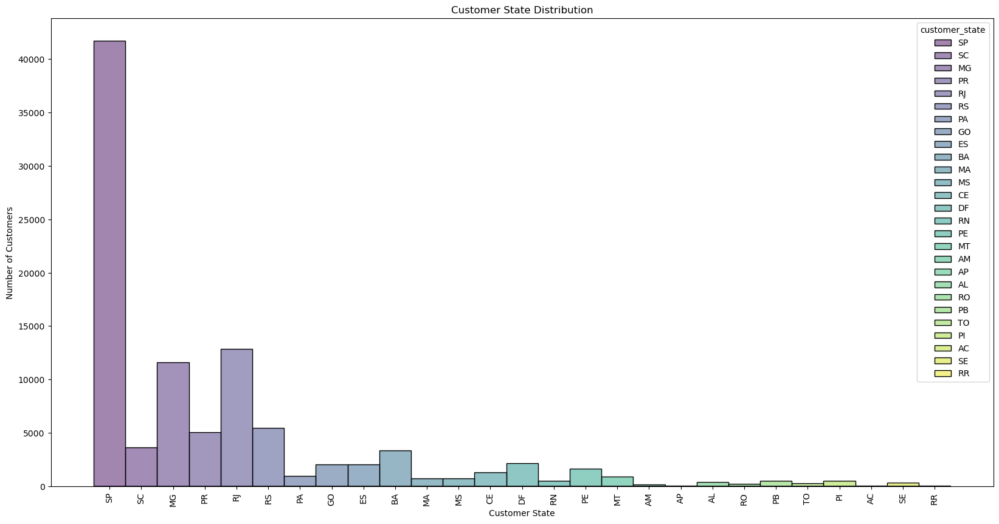

In [28]:
#customer location

plt.figure(figsize=(20,10))
sns.histplot(x='customer_state', data=olist_customers_dataset, palette='viridis', hue='customer_state')
plt.title('Customer State Distribution')
plt.xlabel('Customer State')
plt.ylabel('Number of Customers')
plt.xticks(rotation=90)
plt.show()

In [29]:
count_cust_city = olist_customers_dataset.groupby('customer_city')['customer_id'].count().sort_values(ascending=False).reset_index()
display(count_cust_city.head(), count_cust_city.tail())

,customer_city,customer_id
0,sao paulo,15540
1,rio de janeiro,6882
2,belo horizonte,2773
3,brasilia,2131
4,curitiba,1521


,customer_city,customer_id
4114,ibiara,1
4115,rio espera,1
4116,rio dos indios,1
4117,rio dos cedros,1
4118,lagoao,1


sao paulo for sellers and buyers

# order_dataset

In [30]:
olist_orders_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [31]:
display(olist_orders_dataset.head(), olist_orders_dataset.tail())

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00
99440,66dea50a8b16d9b4dee7af250b4be1a5,edb027a75a1449115f6b43211ae02a24,delivered,2018-03-08 20:57:30,2018-03-09 11:20:28,2018-03-09 22:11:59,2018-03-16 13:08:30,2018-04-03 00:00:00


In [32]:
olist_orders_dataset.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [33]:
olist_orders_dataset.duplicated().sum()

0

In [34]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(olist_orders_dataset):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = olist_orders_dataset.columns
    uniquedata ['Unique Count'] = [olist_orders_dataset[col].nunique() for col in (olist_orders_dataset.columns)]
    uniquedata ['Unique'] = [olist_orders_dataset[col].unique() for col in (olist_orders_dataset.columns)] 
    return uniquedata

unique_values(olist_orders_dataset)

,Columns,Unique Count,Unique
0,order_id,99441,"[e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc7dce0b6741e2150273451, 47770eb9100c2d0c44946d9cf07ec65d, 949d5b44dbf5de918fe9c16f97b45f8a, ad21c59c0840e6cb83a9ceb5573f8159, a4591c265e18cb1dcee52889e2d8acc3, 136cce7faa42fdb2cefd53fdc79a6098, 6514b8ad8028c9f2cc2374ded245783f, 76c6e866289321a7c93b82b54852dc33, e69bfb5eb88e0ed6a785585b27e16dbf, e6ce16cb79ec1d90b1da9085a6118aeb, 34513ce0c4fab462a55830c0989c7edb, 82566a660a982b15fb86e904c8d32918, 5ff96c15d0b717ac6ad1f3d77225a350, 432aaf21d85167c2c86ec9448c4e42cc, dcb36b511fcac050b97cd5c05de84dc3, 403b97836b0c04a622354cf531062e5f, 116f0b09343b49556bbad5f35bee0cdf, 85ce859fd6dc634de8d2f1e290444043, 83018ec114eee8641c97e08f7b4e926f, 203096f03d82e0dffbc41ebc2e2bcfb7, f848643eec1d69395095eb3840d2051e, 2807d0e504d6d4894d41672727bc139f, 95266dbfb7e20354baba07964dac78d5, f3e7c359154d965827355f39d6b1fdac, fbf9ac61453ac646ce8ad9783d7d0af6, acce194856392f074dbf9dada14d8d82, dd78f560c270f1909639c11b925620ea, 91b2a010e1e45e6ba3d133fa997597be, ecab90c9933c58908d3d6add7c6f5ae3, f70a0aff17df5a6cdd9a7196128bd354, 1790eea0b567cf50911c057cf20f90f9, 989225ba6d0ebd5873335f7e01de2ae7, d887b52c6516beb39e8cd44a5f8b60f7, b276e4f8c0fb86bd82fce576f21713e0, 8563039e855156e48fccee4d611a3196, 60550084e6b4c0cb89a87df1f3e5ebd9, 5acce57f8d9dfd55fa48e212a641a69d, 434d158e96bdd6972ad6e6d73ddcfd22, 7206b86ea789983f7a273ea7fa0bc2a8, 1e7aff52cdbb2451ace09d0f848c3699, 6ea2f835b4556291ffdc53fa0b3b95e8, 948097deef559c742e7ce321e5e58919, d22e9fa5731b9e30e8b27afcdc2f8563, ee64d42b8cf066f35eac1cf57de1aa85, 6ebaec694d7025e2ad4a05dba887c032, d17dc4a904426827ca80f2ccb3a6be56, 25f4376934e13d3508486352e11a5db0, 5820a1100976432c7968a52da59e9364, 2ce1ad82022c1ba30c2079502ac725aa, 138849fd84dff2fb4ca70a0a34c4aa1c, 47aa4816b27ba60ec948cd019cc1afc1, 9faeb9b2746b9d7526aef5acb08e2aa0, 641fb0752bf5b5940c376b3a8bb9dc52, e425680f760cbc130be3e53a9773c584, 40c5e18f7d112b59b3e5113a59a905b3, 734e7d1bbaeb2ff82521ca0fe6fb6f79, 66e4624ae69e7dc89bd50222b59f581f, a685d016c8a26f71a0bb67821070e398, 2edfd6d1f0b4cd0db4bf37b1b224d855, 68873cf91053cd11e6b49a766db5af1a, f346ad4ee8f630e5e4ddaf862a34e6dd, 8f06cc6465925031568537b815f1198d, ccbabeb0b02433bd0fcbac46e70339f2, 688052146432ef8253587b930b01a06d, f271576bed568e896f99eb710cd3a6f8, 686541986ecfb7d9296eb67719973bf0, 68e48e68da1f50f7c5838ea75e3a20dd, b52cc4919de82b4d696a4380d10804a3, fdf128b3630c21adc9ca4fb8a51b68ec, a6aeb116d2cb5013eb8a94585b71ffef, fa516182d28f96f5f5c651026b0749ee, 6abaad69b8b349c3a529b4b91ce18e46, 974c1993ab8024d3ed16229183c2308d, 82bce245b1c9148f8d19a55b9ff70644, a910f58086d58b3ae6f37aa712d377b9, bd4bd0194d6d29f83b8557d4b89b572a, 634e8f4c0f6744a626f77f39770ac6aa, 6d25592267349b322799e2beb687871e, b8801cccd8068de30112e4f49903d74a, 2711a938db643b3f0b62ee2c8a2784aa, 3bc77ce8be27211bac313c2daa402d1a, 10c320f977c6a18f91b2d14be13128c6, 0a4a2fccb27bd83a892fa503987a595b, e4de6d53ecff736bc68804b0b6e9f635, 6b860b35691d486e45dc98e3514ec5f6, ec341c54a5ebf8ee0a67a8632aa7579b, cadbb3657dac2dbbd5b84b12e7b78aad, 9defaf92cff22420e4e8ef7784815a55, 20e0101b20700188cadb288126949685, 0e782c3705510e717d28907746cbda82, d3d6788577c9592da441752e8a1dd5e3, 86f21bf63784876b9fd6d35f46581d72, 8447ff843b2616c50c0ced28ab1dae03, f169bd689fb8b32ccd62df9050aebc0b, 77e9941864fc840be8e4b1ba5347c0f7, 41bb5cee06dbf170878a9ef93ac7e7f5, 6a0a8bfbbe700284feb0845d95e0867f, f7959f8385f34c4f645327465a1c9fc4, 23f553848a03aaab35bb3f9f87725125, ...]"
1,customer_id,99441,"[9ef432eb6251297304e76186b10a928d, b0830fb4747a6c6d20dea0b8c802d7ef, 41ce2a54c0b03bf3443c3d931a367089, f88197465ea7920adcdbec7375364d82, 8ab97904e6daea8866dbdbc4fb7aad2c, 503740e9ca751ccdda7ba28e9ab8f608, ed0271e0b7da060a393796590e7b737a, 9bdf08b4b3b52b5526ff42d37d47f222, f54a9f0e6b351c431402b8461ea51999, 31ad1d1b63eb9962463f764d4e6e0c9d, 494dded5b201313c64ed7f100595b95c, 7711cf624183d843aafe81855097bc37, d3e3b74c766bc6214e0c830b17ee2341, 19402a48fe860416adf93348aba37740, 3df704f53d3f1d4818840b34ec672a9f, 3b6828a50ffe54

# order item dataset

In [35]:
olist_order_items_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [36]:
display(olist_order_items_dataset.head(), olist_order_items_dataset.tail())

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72
112649,fffe41c64501cc87c801fd61db3f6244,1,350688d9dc1e75ff97be326363655e01,f7ccf836d21b2fb1de37564105216cc1,2018-06-12 17:10:13,43.00,12.79


In [37]:
olist_order_items_dataset.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [38]:
olist_order_items_dataset.duplicated().sum()

0

In [39]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(olist_order_items_dataset):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = olist_order_items_dataset.columns
    uniquedata ['Unique Count'] = [olist_order_items_dataset[col].nunique() for col in (olist_order_items_dataset.columns)]
    uniquedata ['Unique'] = [olist_order_items_dataset[col].unique() for col in (olist_order_items_dataset.columns)] 
    return uniquedata

unique_values(olist_order_items_dataset)

,Columns,Unique Count,Unique
0,order_id,98666,"[00010242fe8c5a6d1ba2dd792cb16214, 00018f77f2f0320c557190d7a144bdd3, 000229ec398224ef6ca0657da4fc703e, 00024acbcdf0a6daa1e931b038114c75, 00042b26cf59d7ce69dfabb4e55b4fd9, 00048cc3ae777c65dbb7d2a0634bc1ea, 00054e8431b9d7675808bcb819fb4a32, 000576fe39319847cbb9d288c5617fa6, 0005a1a1728c9d785b8e2b08b904576c, 0005f50442cb953dcd1d21e1fb923495, 00061f2a7bc09da83e415a52dc8a4af1, 00063b381e2406b52ad429470734ebd5, 0006ec9db01a64e59a68b2c340bf65a7, 0008288aa423d2a3f00fcb17cd7d8719, 0009792311464db532ff765bf7b182ae, 0009c9a17f916a706d71784483a5d643, 000aed2e25dbad2f9ddb70584c5a2ded, 000c3e6612759851cc3cbb4b83257986, 000e562887b1f2006d75e0be9558292e, 000e63d38ae8c00bbcb5a30573b99628, 000e906b789b55f64edcb1f84030f90d, 000f25f4d72195062c040b12dce9a18a, 001021efaa8636c29475e7734483457d, 0010b2e5201cc5f1ae7e9c6cc8f5bd00, 00119ff934e539cf26f92b9ef0cdfed8, 0011d82c4b53e22e84023405fb467e57, 00125cb692d04887809806618a2a145f, 00130c0eee84a3d909e75bc08c5c3ca1, 0013503b13da1eac686219390b7d641b, 00137e170939bba5a3134e2386413108, 001427c0ec99cf8af737bd88e92fd444, 00143d0f86d6fbd9f9b38ab440ac16f5, 0014ae671de39511f7575066200733b7, 0015ebb40fb17286bea51d4607c4733c, 00169e31ef4b29deaae414f9a5e95929, 0016dfedd97fc2950e388d2971d718c7, 0017afd5076e074a48f1f1a4c7bac9c5, 001862358bf858722e1e2ae000cfed8b, 0019c29108428acffd089c36103c9440, 001ab0a7578dd66cd4b0a71f5b6e1e41, 001ac194d4a326a6fa99b581e9a3d963, 001b76dd48a5b1eee3e87778daa40df8, 001c85b5f68d2be0cb0797afc9e8ce9a, 001d8f0e34a38c37f7dba2a37d4eba8b, 001daeb0eddc45b999bad0801ad9d273, 001dbc16dc51075e987543d23a0507c7, 001e7ba991be1b19605ca0316e7130f9, 001e7cf2ad6bef3ade12ebc56ceaf0f3, 0020262c8a370bd5a174ea6a2a267321, 0020a222f55eb79a372d0efee3cca688, 002175704e8b209f61b9ad5cfd92b60e, 00229e4e43f7a7e0b9dd819ad43268d3, 0025081dcf9330f9a5052ae82c6ce396, 00254baeb6c932b0a8aeead91fbd02b5, 00259a44fcad3fc0474329e925d14fc3, 0025c5d1a8ca53a240ec2634bb4492ea, 002611a77fe03d076285fd4ca95db77c, 002691433f09002ac9ca0c4e8dbb8ead, 0026a368634b6e6f34f33b1499773a30, 00275bce676303c3bfd7292aefdfa223, 00276d5c3491fbf55305e26891040df9, 002834535f7a609a5c68266f173fa59e, 0028de0ca693a1bb26448916a81105cc, 002955b0acc63d04f6724a31967e82bd, 0029c5db35ef291ce99d1262012e7daa, 0029f17cf0e7640c5cb6825af681303f, 002af7fa9eb99d1456bceb6a13d6fc0b, 002b430ff89b3a24c31a1170acbbedea, 002b4e6fa42cd4a22cc86abc18fe9c05, 002c9def9c9b951b1bec6d50753c9891, 002d040018d12a3853c059f7f23ab5b1, 002f16b7bc4530031b7d90f791b12d8a, 002f19a65a2ddd70a090297872e6d64e, 002f98c0f7efd42638ed6100ca699b42, 0030d783f979fbc5981e75613b057344, 0030ff924c38549807645976adeef2c0, 00310b0c75bb13015ec4d82d341865a4, 00324b3eda39ba5ecce3945823e3594c, 0032d07457ae9c806c79368d7d9ce96b, 003324c70b19a16798817b2b3640e721, 00335b686d693c7d72deeb12f8e89227, 00335f75ea6a4455b524a8dd177067f5, 00337fe25a3780b3424d9ad7c5a4b35e, 003423b755b562962a6225a8de40d12e, 00345f338696283410b7977d2e3efc89, 0035246a40f520710769010f752e7507, 0035c0b07126fe9c24a325216fb96064, 0035e6b7ade84b3f5b86bd49814793df, 0036757472ece3dde52fd4bfd929c90e, 0036887767dea4bd43b1a88cd0d9477a, 00378c6c981f234634c0b9d6128df6dd, 003822434f91204da0a51fe4cf2aba18, 0039500db36d50d7d0bfaf23723550f3, 003a7f59d7e08a9c61d9e2881fe6459c, 003a94f778ef8cfd50247c8c1b582257, 003cc6161d7a2593f2525cce0c330d32, 003d0634280ff3d1d3a54459349a6899, 003d804eef0e1b856881cd18e0cc0d4c, 003d9fc84ad902adf2265248b5ffe1a4, 003edccf16bc5ec447f592913b3df2b4, ...]"
1,order_item_id,21,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]"
2,product_id,32951,"[4244733e06e7ecb4970a6e2683c13e61, e5f2d52b802189ee658865ca93d83a8f, c777355d18b72b67abbeef9df44fd0fd, 7634da152a4610f1595efa32f14722fc, ac6c3623068f30de03045865e4e10089, ef92defde845ab8450f9d70c526ef70f, 8d4f2bb7e93e6710a28f34fa83ee7d28, 557d850972a7d6f792fd18ae1400d9b6, 310ae3c140ff94b03219ad0adc3c778f, 4535b0e1091c278dfd193e5a1d63b39f, d63c1011f49d98b976c352955b1c4bea, f177554ea93259a5b282f24e33f65ab6, 99a4788cb24856965c36

# order payment dataset

In [40]:
olist_order_payments_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [41]:
display(olist_order_payments_dataset.head(), olist_order_payments_dataset.tail())

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


,order_id,payment_sequential,payment_type,payment_installments,payment_value
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54
103885,28bbae6599b09d39ca406b747b6632b1,1,boleto,1,191.58


In [42]:
olist_order_payments_dataset.isna().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [43]:
olist_order_payments_dataset.duplicated().sum()

0

In [44]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(olist_order_payments_dataset):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = olist_order_payments_dataset.columns
    uniquedata ['Unique Count'] = [olist_order_payments_dataset[col].nunique() for col in (olist_order_payments_dataset.columns)]
    uniquedata ['Unique'] = [olist_order_payments_dataset[col].unique() for col in (olist_order_payments_dataset.columns)] 
    return uniquedata

unique_values(olist_order_payments_dataset)

,Columns,Unique Count,Unique
0,order_id,99440,"[b81ef226f3fe1789b1e8b2acac839d17, a9810da82917af2d9aefd1278f1dcfa0, 25e8ea4e93396b6fa0d3dd708e76c1bd, ba78997921bbcdc1373bb41e913ab953, 42fdf880ba16b47b59251dd489d4441a, 298fcdf1f73eb413e4d26d01b25bc1cd, 771ee386b001f06208a7419e4fc1bbd7, 3d7239c394a212faae122962df514ac7, 1f78449c87a54faf9e96e88ba1491fa9, 0573b5e23cbd798006520e1d5b4c6714, d88e0d5fa41661ce03cf6cf336527646, 2480f727e869fdeb397244a21b721b67, 616105c9352a9668c38303ad44e056cd, cf95215a722f3ebf29e6bbab87a29e61, 769214176682788a92801d8907fa1b40, 12e5cfe0e4716b59afb0e0f4a3bd6570, 61059985a6fc0ad64e95d9944caacdad, 79da3f5fe31ad1e454f06f95dc032ad5, 8ac09207f415d55acff302df7d6a895c, b2349a3f20dfbeef62e7b31baa22f84b, 5a1f6d22f7dfb061ef29216b9af687a1, 4214cda550ece8ee66441f459dc33a8c, adfbf6c2a620196f9a3ec747491c72b7, 4d680edbaa7d3d9bed69532957368a03, 8cd68144cdb62dc0d60848cf8616d2a4, 5cfd514482e22bc992e7693f0e3e8df7, d0a945f85ba1074b60aac97ade7e240e, c39414c195d0f94c9d9c35e7c6ed4f1a, 5d9c5817e278892b7498d90bfa28ade8, b69b9260e79a0da00e15f48de1bd2524, f45074ae38f2e01d9b854ec8d40362ff, 81cedc4d2132eb6f512354166e51b187, 595f598849d89203c28d05d0fbf3f92e, f9d0ec2fa088ac583e1ccd15b6686073, e647bf617de735448a4ba54f8910393c, b2bb080b6bc860118a246fd9b6fad6da, 23f10f509600c30cf2852f9dbdf28fc3, f86f6472fa9f395d8d9a6751ca118afb, 1dcf0c8cd36ffaf57784fbdc90079310, 00d8d65b666158b633f96054d31af43b, cf30fe76d1505192acee1c6dccb15545, d3e774a185c0b1b2286ffd6c70abe2e6, 32b1d8f3789a57f1f752e20ac7404b4c, c10d412026c4077b8e83acf0fea04eee, 56c3277583e16009c925fdf116df420f, 0e0441786430b7cfcd0d91f822ea4c99, 6ffb3f1686bceae3466facf7e02ce3fb, afef48d3c8a0b1b7c9b7f8f922fb5674, c0db7d31ace61fc360a3eaa34dd3457c, d574338f566ca28dd67820f48ec1f1d8, 1807cc736321f14baa58ef39cf6e5989, e8977f709bbb0367f51b589e6325f991, 2e2c60b99754ae1e4d8b18846cfec9f2, 1ffb3c1929b16d9c1aec1958e11b3e9b, 95442deb81a5d91c97c0df96b431634a, 10af96a0689260134307879127ac1952, 85eef2d342b0de363c45c1bc324729c5, aa964845f1de8125410aea8b73e9e1ec, 343348b1e29e9fa9e7b6ab1027f9177d, ad4098a257676ea4d394fb3bbbf36ca3, 3e0c3cab458e8b3cc8d1d38ecb7e7775, 3ab4eea6776259ae8dfbabaeffece352, 10d9871bed9fb8d0887d3b9022edd1ff, c108072ab31ec90a754129c171577f5f, fc662bafa52d2ef16078f6f6141009d6, 4217849b1ff18a9270fe048eabc4dc45, 795c16acb4e3c30dfa5b6827727ef488, 55e2d723733c45033e71cb4d44690234, 947e9c6bfd83a06953c420ef92d3da6e, 60e43c5f5ba559d9dd19357ed72cb2f2, e3e9e3295f4e1512167c232a0aaae8a5, 460d57443ffdcaeba240360239747cf7, 4cb51127f19f7254b320efe1718477dd, 110d9355d6338eab0a65a0cacdde5434, 42f5954cda381bd032934ee38c453711, 3689194c14ad4e2e7361ebd1df0e77b0, 97c111c4f22dfa1089a9c0b5338dcc79, 4b2d035932915aa9c2a0d4d84cd6d3b0, e1b4ee0e390fbac1dec439d72b45a115, fee72a68ce935ebf2939fe72f27d3d9b, 4d3bfdf4c7d6578ea445d588371ae10e, 4c2e1a95586c815795a324d1599e7b5a, c9f23db8a1cb725df9bdb3383bd72b38, 8e47a04b25d7a7075064e8e0bd2e0318, 723e462ce1ee50e024887c0b403130f3, fa2ea4b6e84c1c0fc4f3a6d468c55183, fb1a2a1296f822405a946cbdfc0d3ed6, 198298d54f269d8c5fe89e85a859af61, b19ca559688b49e8cf7f88c1aa3f0009, 5be8d4719fe2e3669e2d07dddf3b6b0c, 4a02e985c7239d866a632f07ed20d9c0, 3e17eef8a8bd0131c7aed90d7508799e, f8d323a2702fed37f0229965f7e9f8b3, de4090fd9b7900d46323b0c7c36b7128, 17e5131fe1d4b1a8dc14d4a66914f9d7, 20f136d890c31a62486c809f91a5b098, 557cc2675910c4a6c9b54ad276f25097, d60a89ab9bc1e68834465ae630c3343e, 3ba2d0012b1f34bc6ccbc31c4ba69f93, d46f45b0d795bcf47a19d301710e63fe, ...]"
1,payment_sequential,29,"[1, 2, 4, 5, 3, 8, 6, 7, 10, 11, 17, 19, 27, 12, 9, 15, 13, 14, 16, 25, 22, 26, 29, 28, 18, 21, 24, 23, 20]"
2,payment_type,5,"[credit_card, boleto, voucher, debit_card, not_defined]"
3,payment_installments,24,"[8, 1, 2, 3, 6, 5, 4, 10, 7, 12, 9, 13, 15, 24, 11, 18, 14, 20, 21, 17, 22, 0, 16, 23]"
4,payment_value,29077,"[99.33, 24.39, 65.71, 107.78, 128.45, 96.12, 81.16, 51.84, 341.09, 51.95, 188.73, 141.9, 75.78, 102.66, 105.28, 157.45, 132.04, 98.94, 244.15, 136.71, 47.69, 170.57, 67.5, 353.09, 330.66, 45.17, 541.

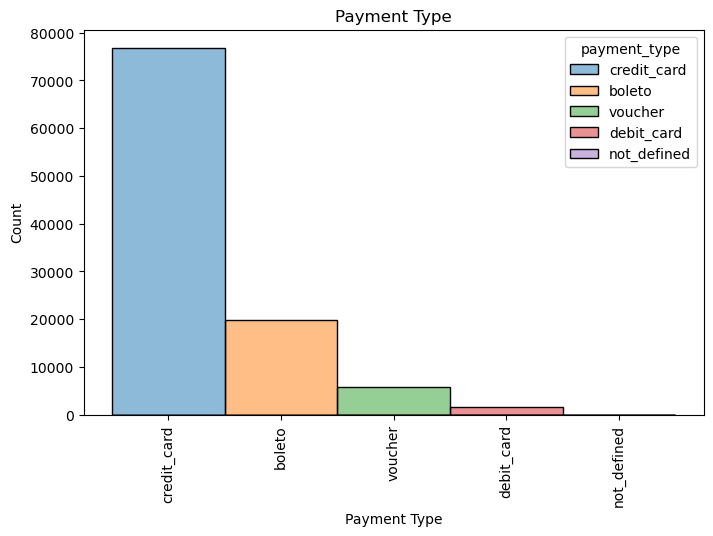

In [45]:
#payment type distribution
plt.figure(figsize=(8,5))
sns.histplot(x='payment_type', data=olist_order_payments_dataset, palette='tab10', hue='payment_type')
plt.title('Payment Type')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [46]:
df_plot_paymenttype = olist_order_payments_dataset
fig = px.histogram(df_plot_paymenttype, x="payment_installments",
             color='payment_installments', barmode='relative',
             histfunc='count', text_auto=True,
             height=700, width=700,
             labels={
                     "payment_installments": "Installments",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.2f}</b>")
fig.update_layout(
    title_text="Number of installments", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

In [47]:
df_plot_paymentinstall = olist_order_payments_dataset
fig = px.histogram(df_plot_paymentinstall, x="payment_type",
             color='payment_type', barmode='relative',
             histfunc='count', text_auto=True,
             height=500, width=600,
             labels={
                     "payment_type": "Types of Payment",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.2f}</b>")
fig.update_layout(
    title_text="Payment types", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

# order review data set

In [48]:
olist_order_reviews_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [49]:
olist_order_reviews_dataset.isna().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [50]:
olist_order_reviews_dataset.duplicated().sum()

0

In [51]:
display(olist_order_reviews_dataset.head(), olist_order_reviews_dataset.tail())

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela Internet seguro e prático Parabéns a todos feliz Páscoa,2018-03-01 00:00:00,2018-03-02 10:26:53


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super recomendo essa loja!",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13
99223,efe49f1d6f951dd88b51e6ccd4cc548f,90531360ecb1eec2a1fbb265a0db0508,1,NaN,"meu produto chegou e ja tenho que devolver, pois está com defeito , não segurar carga",2017-07-03 00:00:00,2017-07-03 21:01:49


In [52]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_values(olist_order_reviews_dataset):
    
    uniquedata = pd.DataFrame()
    uniquedata ['Columns'] = olist_order_reviews_dataset.columns
    uniquedata ['Unique Count'] = [olist_order_reviews_dataset[col].nunique() for col in (olist_order_reviews_dataset.columns)]
    uniquedata ['Unique'] = [olist_order_reviews_dataset[col].unique() for col in (olist_order_reviews_dataset.columns)] 
    return uniquedata

unique_values(olist_order_reviews_dataset)

Columns  Unique Count  \
0                review_id         98410   
1                 order_id         98673   
2             review_score             5   
3     review_comment_title          4527   
4   review_comment_message         36159   
5     review_creation_date           636   
6  review_answer_timestamp         98248   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [53]:
df_plot_review = olist_order_reviews_dataset
fig = px.histogram(df_plot_review, x="review_score",
             color='review_score', barmode='relative',
             histfunc='count', text_auto=True,
             height=700, width=700,
             labels={
                     "review_score": "Review Score",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.2f}</b>")
fig.update_layout(
    title_text="Rating", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

In [54]:
average_review = olist_order_reviews_dataset['review_score'].mean()
display(average_review)

4.08642062404257

# product dataset

In [55]:
olist_products_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [56]:
olist_products_dataset.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [57]:
olist_products_dataset.duplicated().sum()

0

In [58]:
display(olist_products_dataset.head(), olist_products_dataset.tail())

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0
32950,106392145fca363410d287a815be6de4,cama_mesa_banho,58.0,309.0,1.0,2083.0,12.0,2.0,7.0


In [59]:

count_categoryname = olist_products_dataset.groupby('product_category_name')['product_id'].count().sort_values(ascending=False).reset_index()
display(count_categoryname.head(), count_categoryname.tail())

,product_category_name,product_id
0,cama_mesa_banho,3029
1,esporte_lazer,2867
2,moveis_decoracao,2657
3,beleza_saude,2444
4,utilidades_domesticas,2335


,product_category_name,product_id
68,casa_conforto_2,5
69,fashion_roupa_infanto_juvenil,5
70,pc_gamer,3
71,seguros_e_servicos,2
72,cds_dvds_musicais,1


# product translation

In [60]:
product_category_name_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [61]:
display(product_category_name_translation.head(), product_category_name_translation.tail())

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


,product_category_name,product_category_name_english
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes
70,seguros_e_servicos,security_and_services


# Analysis of merging data set

# Load necessary datasets:
olist_geolocation_dataset = pd.read_csv('archive/olist_geolocation_dataset_cleaned_geolocation_city.csv', delimiter=';') 
olist_orders_dataset = pd.read_csv('archive/olist_orders_dataset.csv')
olist_customers_dataset = pd.read_csv('archive/olist_customers_dataset.csv')
olist_order_items_dataset = pd.read_csv('archive/olist_order_items_dataset.csv')
olist_order_payments_dataset = pd.read_csv('archive/olist_order_payments_dataset.csv')
olist_order_reviews_dataset = pd.read_csv('archive/olist_order_reviews_dataset.csv')
olist_products_dataset = pd.read_csv('archive/olist_products_dataset.csv')
olist_sellers_dataset = pd.read_csv('archive/olist_sellers_dataset.csv')
product_category_name_translation = pd.read_csv('archive/product_category_name_translation.csv')

In [62]:
# merge orders + order_items:
orders_items = pd.merge(olist_orders_dataset, olist_order_items_dataset, on='order_id', how='left')

# Merge with payments:
orders_items_payments = pd.merge(orders_items, olist_order_payments_dataset, on='order_id', how='left')

# Merge with reviews:
orders_items_payments_reviews = pd.merge(orders_items_payments, olist_order_reviews_dataset, on='order_id', how='left')

# Merge with product data:
orders_products = pd.merge(orders_items_payments_reviews, olist_products_dataset, on='product_id', how='left')

# Merge product translation:
full_business_df = pd.merge(orders_products, product_category_name_translation, on='product_category_name', how='left')



In [63]:
#customer segment

customer_order = pd.merge(olist_customers_dataset, olist_orders_dataset, on='customer_id', how='left')
display(customer_order.head(), customer_order.tail())

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06 00:00:00
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13 00:00:00
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10 00:00:00
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15 00:00:00


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-11 02:08:36,2018-04-13 20:06:37,2018-04-25 00:00:00
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,delivered,2018-04-04 08:20:22,2018-04-04 08:35:12,2018-04-05 18:42:35,2018-04-11 18:54:45,2018-04-20 00:00:00
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,delivered,2018-04-08 20:11:50,2018-04-08 20:30:03,2018-04-09 17:52:17,2018-05-09 19:03:15,2018-05-02 00:00:00
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,delivered,2017-11-03 21:08:33,2017-11-03 21:31:20,2017-11-06 18:24:41,2017-11-16 19:58:39,2017-12-05 00:00:00
99440,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP,28db69209a75e59f20ccbb5c36a20b90,delivered,2017-12-19 14:27:23,2017-12-19 18:50:39,2017-12-21 19:17:21,2017-12-26 18:42:36,2018-01-08 00:00:00


In [64]:
customer_order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   customer_id                    99441 non-null  object
 1   customer_unique_id             99441 non-null  object
 2   customer_zip_code_prefix       99441 non-null  int64 
 3   customer_city                  99441 non-null  object
 4   customer_state                 99441 non-null  object
 5   order_id                       99441 non-null  object
 6   order_status                   99441 non-null  object
 7   order_purchase_timestamp       99441 non-null  object
 8   order_approved_at              99281 non-null  object
 9   order_delivered_carrier_date   97658 non-null  object
 10  order_delivered_customer_date  96476 non-null  object
 11  order_estimated_delivery_date  99441 non-null  object
dtypes: int64(1), object(11)
memory usage: 9.1+ MB


In [65]:
orders_per_customer = customer_order.groupby('customer_unique_id')['order_id'].nunique()
n_repeat_customers = (orders_per_customer > 1).sum()


n_customers = customer_order['customer_unique_id'].nunique()

repeat_pcg = n_repeat_customers / n_customers
onetime_pcg = 1 - repeat_pcg

display(f'Total Customers: {n_customers}')
display(f'Total Repeat Customers: {n_repeat_customers}')
display(f'Total One-time Customers: {n_customers - n_repeat_customers}')
display(f'Repeat Customers Percentage: {repeat_pcg:.2%}')
display(f'One time Customers Percentage: {onetime_pcg:.2%}')
display(orders_per_customer.describe())

'Total Customers: 96096'

'Total Repeat Customers: 2997'

'Total One-time Customers: 93099'

'Repeat Customers Percentage: 3.12%'

'One time Customers Percentage: 96.88%'

count    96096.000000
mean         1.034809
std          0.214384
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         17.000000
Name: order_id, dtype: float64

In [66]:
#order 

order_merge = pd.merge(olist_order_items_dataset, olist_orders_dataset,  on='order_id', how='left')
display(order_merge.head(), order_merge.tail())

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18 00:00:00
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01 00:00:00
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10 00:00:00
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25 00:00:00
112649,fffe41c64501cc87c801fd61db3f6244,1,350688d9dc1e75ff97be326363655e01,f7ccf836d21b2fb1de37564105216cc1,2018-06-12 17:10:13,43.00,12.79,96d649da0cc4ff33bb408b199d4c7dcf,delivered,2018-06-09 17:00:18,2018-06-09 17:10:13,2018-06-11 14:11:00,2018-06-14 17:56:26,2018-06-28 00:00:00


In [67]:
# order with payment types
order_merge_payment = pd.merge(order_merge, olist_order_payments_dataset,  on='order_id', how='left')
display(order_merge_payment.head(), order_merge_payment.tail())

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,1.0,credit_card,2.0,72.19
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,1.0,credit_card,3.0,259.83
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,1.0,credit_card,5.0,216.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,1.0,credit_card,2.0,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,1.0,credit_card,3.0,218.04


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value
117599,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18 00:00:00,1.0,boleto,1.0,343.40
117600,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01 00:00:00,1.0,boleto,1.0,386.53
117601,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10 00:00:00,1.0,credit_card,3.0,116.85
117602,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25 00:00:00,1.0,credit_card,3.0,64.71
117603,fffe41c64501cc87c801fd61db3f6244,1,350688d9dc1e75ff97be326363655e01,f7ccf836d21b2fb1de37564105216cc1,2018-06-12 17:10:13,43.00,12.79,96d649da0cc4ff33bb408b199d4c7dcf,delivered,2018-06-09 17:00:18,2018-06-09 17:10:13,2018-06-11 14:11:00,2018-06-14 17:56:26,2018-06-28 00:00:00,1.0,credit_card,1.0,55.79


In [68]:
#order payment review
order_merge_payment_review = pd.merge(order_merge_payment, olist_order_reviews_dataset,  on='order_id', how='left')
display(order_merge_payment_review.head(), order_merge_payment_review.tail())

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,1.0,credit_card,3.0,259.83,7b07bacd811c4117b742569b04ce3580,4.0,NaN,NaN,2017-05-13 00:00:00,2017-05-15 11:34:13
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,1.0,credit_card,5.0,216.87,0c5b33dea94867d1ac402749e5438e8b,5.0,NaN,Chegou antes do prazo previsto e o produto surpreendeu pela qualidade. Muito satisfatório.,2018-01-23 00:00:00,2018-01-23 16:06:31
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,1.0,credit_card,2.0,25.78,f4028d019cb58564807486a6aaf33817,4.0,NaN,NaN,2018-08-15 00:00:00,2018-08-15 16:39:01
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,1.0,credit_card,3.0,218.04,940144190dcba6351888cafa43f3a3a5,5.0,NaN,Gostei pois veio no prazo determinado .,2017-03-02 00:00:00,2017-03-03 10:54:59


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
118305,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18 00:00:00,1.0,boleto,1.0,343.40,9185f849f32d82e216a4e025e0c50f5c,5.0,NaN,NaN,2018-05-11 00:00:00,2018-05-14 12:53:47
118306,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01 00:00:00,1.0,boleto,1.0,386.53,be803f6a93d64719fd685c1cc610918a,5.0,NaN,NaN,2018-07-24 00:00:00,2018-07-25 09:25:29
118307,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10 00:00:00,1.0,credit_card,3.0,116.85,dbdd81cd59a1a9f94a10a990b4d48dce,5.0,NaN,NaN,2017-10-29 00:00:00,2017-10-29 21:33:52
118308,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25 00:00:00,1.0,credit_card,3.0,64.71,fba117c9ac40d41ca7be54741f471303,5.0,NaN,Recebi o produto antes do prazo e corretamente.,2017-08-17 00:00:00,2017-08-18 12:24:05
118309,fffe41c64501cc87c801fd61db3f6244,1,350688d9dc1e75ff97be326363655e01,f7ccf836d21b2fb1de37564105216cc1,2018-06-12 17:10:13,43.00,12.79,96d649da0cc4ff33bb408b199d4c7dcf,delivered,2018-06-09 17:00:18,2018-06-09 17:10:13,2018-06-11 14:11:00,2018-06-14 17:56:26,2018-06-28 00:00:00,1.0,credit_card,1.0,55.79,b2700869a37f1aafc9dda829dc2f9027,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-17 21:27:09


In [69]:
#order products

order_byproducts= pd.merge(order_merge_payment_review, olist_products_dataset,  on='product_id', how='left')
display(order_byproducts.head(), order_byproducts.tail())


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,1.0,credit_card,3.0,259.83,7b07bacd811c4117b742569b04ce3580,4.0,NaN,NaN,2017-05-13 00:00:00,2017-05-15 11:34:13,pet_shop,56.0,239.0,2.0,30000.0,50.0,30.0,40.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,1.0,credit_card,5.0,216.87,0c5b33dea94867d1ac402749e5438e8b,5.0,NaN,Chegou antes do prazo previsto e o produto surpreendeu pela qualidade. Muito satisfatório.,2018-01-23 00:00:00,2018-01-23 16:06:31,moveis_decoracao,59.0,695.0,2.0,3050.0,33.0,13.0,33.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,1.0,credit_card,2.0,25.78,f4028d019cb58564807486a6aaf33817,4.0,NaN,NaN,2018-08-15 00:00:00,2018-08-15 16:39:01,perfumaria,42.0,480.0,1.0,200.0,16.0,10.0,15.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,1.0,credit_card,3.0,218.04,940144190dcba6351888cafa43f3a3a5,5.0,NaN,Gostei pois veio no prazo determinado .,2017-03-02 00:00:00,2017-03-03 10:54:59,ferramentas_jardim,59.0,409.0,1.0,3750.0,35.0,40.0,30.0


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
118305,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18 00:00:00,1.0,boleto,1.0,343.40,9185f849f32d82e216a4e025e0c50f5c,5.0,NaN,NaN,2018-05-11 00:00:00,2018-05-14 12:53:47,utilidades_domesticas,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0
118306,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01 00:00:00,1.0,boleto,1.0,386.53,be803f6a93d64719fd685c1cc610918a,5.0,NaN,NaN,2018-07-24 00:00:00,2018-07-25 09:25:29,informatica_acessorios,31.0,232.0,1.0,8950.0,45.0,26.0,38.0
118307,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10 00:00:00,1.0,credit_card,3.0,116.85,dbdd81cd59a1a9f94a10a990b4d48dce,5.0,NaN,NaN,2017-10-29 00:00:00,2017-10-29 21:33:52,esporte_lazer,43.0,869.0,1.0,967.0,21.0,24.0,19.0
118308,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25 00:00:00,1.0,credit_card,3.0,64.71,fba117c9ac40d41ca7be54741f471303,5.0,NaN,Recebi o produto antes do prazo e corretamente.,2017-08-17 00:00:00,2017-08-18 12:24:05,informatica_acessorios,56.0,1306.0,1.0,100.0,20.0,20.0,20.0
118309,fffe41c64501cc87c801fd61db3f6244,1,350688d9dc1e75ff97be326363655e01,f7ccf836d21b2fb1de37564105216cc1,2018-06-12 17:10:13,43.00,12.79,96d649da0cc4ff33bb408b199d4c7dcf,delivered,2018-06-09 17:00:18,2018-06-09 17:10:13,2018-06-11 14:11:00,2018-06-14 17:56:26,2018-06-28 00:00:00,1.0,credit_card,1.0,55.79,b2700869a37f1aafc9dda829dc2f9027,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-17 21:27:09,cama_mesa_banho,47.0,511.0,1.0,600.0,30.0,3.0,19.0


In [70]:
#complete

fulldataset = pd.merge(order_byproducts, product_category_name_translation,  on='product_category_name', how='left')
display(fulldataset.head(), fulldataset.tail())

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,1.0,credit_card,3.0,259.83,7b07bacd811c4117b742569b04ce3580,4.0,NaN,NaN,2017-05-13 00:00:00,2017-05-15 11:34:13,pet_shop,56.0,239.0,2.0,30000.0,50.0,30.0,40.0,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,1.0,credit_card,5.0,216.87,0c5b33dea94867d1ac402749e5438e8b,5.0,NaN,Chegou antes do prazo previsto e o produto surpreendeu pela qualidade. Muito satisfatório.,2018-01-23 00:00:00,2018-01-23 16:06:31,moveis_decoracao,59.0,695.0,2.0,3050.0,33.0,13.0,33.0,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,1.0,credit_card,2.0,25.78,f4028d019cb58564807486a6aaf33817,4.0,NaN,NaN,2018-08-15 00:00:00,2018-08-15 16:39:01,perfumaria,42.0,480.0,1.0,200.0,16.0,10.0,15.0,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,1.0,credit_card,3.0,218.04,940144190dcba6351888cafa43f3a3a5,5.0,NaN,Gostei pois veio no prazo determinado .,2017-03-02 00:00:00,2017-03-03 10:54:59,ferramentas_jardim,59.0,409.0,1.0,3750.0,35.0,40.0,30.0,garden_tools


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
118305,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18 00:00:00,1.0,boleto,1.0,343.40,9185f849f32d82e216a4e025e0c50f5c,5.0,NaN,NaN,2018-05-11 00:00:00,2018-05-14 12:53:47,utilidades_domesticas,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0,housewares
118306,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01 00:00:00,1.0,boleto,1.0,386.53,be803f6a93d64719fd685c1cc610918a,5.0,NaN,NaN,2018-07-24 00:00:00,2018-07-25 09:25:29,informatica_acessorios,31.0,232.0,1.0,8950.0,45.0,26.0,38.0,computers_accessories
118307,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10 00:00:00,1.0,credit_card,3.0,116.85,dbdd81cd59a1a9f94a10a990b4d48dce,5.0,NaN,NaN,2017-10-29 00:00:00,2017-10-29 21:33:52,esporte_lazer,43.0,869.0,1.0,967.0,21.0,24.0,19.0,sports_leisure
118308,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25 00:00:00,1.0,credit_card,3.0,64.71,fba117c9ac40d41ca7be54741f471303,5.0,NaN,Recebi o produto antes do prazo e corretamente.,2017-08-17 00:00:00,2017-08-18 12:24:05,informatica_acessorios,56.0,1306.0,1.0,100.0,20.0,20.0,20.0,computers_accessories
118309,fffe41c64501cc87c801fd61db3f6244,1,350688d9dc1e75ff97be326363655e01,f7ccf836d21b2fb1de37564105216cc1,2018-06-12 17:10:13,43.00,12.79,96d649da0cc4ff33bb408b199d4c7dcf,delivered,2018-06-09 17:00:18,2018-06-09 17:10:13,2018-06-11 14:11:00,2018-06-14 17:56:26,2018-06-28 00:00:00,1.0,credit_card,1.0,55.79,b2700869a37f1aafc9dda829dc2f9027,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-17 21:27:09,cama_mesa_banho,47.0,511.0,1.0,600.0,30.0,3.0,19.0,bed_bath_table


In [71]:
fulldataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118310 entries, 0 to 118309
Data columns (total 33 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       118310 non-null  object 
 1   order_item_id                  118310 non-null  int64  
 2   product_id                     118310 non-null  object 
 3   seller_id                      118310 non-null  object 
 4   shipping_limit_date            118310 non-null  object 
 5   price                          118310 non-null  float64
 6   freight_value                  118310 non-null  float64
 7   customer_id                    118310 non-null  object 
 8   order_status                   118310 non-null  object 
 9   order_purchase_timestamp       118310 non-null  object 
 10  order_approved_at              118295 non-null  object 
 11  order_delivered_carrier_date   117056 non-null  object 
 12  order_delivered_customer_date 

In [72]:
fulldataset.isna().sum()

order_id                              0
order_item_id                         0
product_id                            0
seller_id                             0
shipping_limit_date                   0
price                                 0
freight_value                         0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                    15
order_delivered_carrier_date       1254
order_delivered_customer_date      2588
order_estimated_delivery_date         0
payment_sequential                    3
payment_type                          3
payment_installments                  3
payment_value                         3
review_id                           978
review_score                        978
review_comment_title             104418
review_comment_message            68628
review_creation_date                978
review_answer_timestamp             978
product_category_name              1709


In [73]:
fulldataset.duplicated().sum()

0

In [74]:
#basket size based on order_item_id
n_item_per_order = fulldataset.groupby('order_item_id')['order_id'].count().reset_index()
total_reviews = n_item_per_order['order_id'].sum()
n_item_per_order['percentage (%)'] = (n_item_per_order['order_id'] / total_reviews * 100).round(3)

# Display the result
display(n_item_per_order)

,order_item_id,order_id,percentage (%)
0,1,103645,87.605
1,2,10317,8.720
2,3,2396,2.025
3,4,995,0.841
4,5,472,0.399
5,6,265,0.224
6,7,61,0.052
7,8,37,0.031
8,9,29,0.025
9,10,26,0.022


In [75]:
df_plot_itemperoder = fulldataset
fig = px.histogram(df_plot_itemperoder, x="order_item_id",
             color='order_item_id', barmode='relative',
             histfunc='count', text_auto=True,
             height=1000, width=700,
             labels={
                     "order_item_id": "Order Item ID",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.2f}</b>")
fig.update_layout(
    title_text="Number of item per order", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

In [76]:
popular_products = fulldataset.groupby(['product_id','product_category_name','product_category_name_english']).agg(sales_count=('order_id', 'count'), revenue = ('price','sum')).reset_index()
popular_products['profit'] = (popular_products['revenue'] * 0.21).round(2) 
top10_products = popular_products.sort_values(by='sales_count', ascending=False).head(10)      
display(top10_products)

,product_id,product_category_name,product_category_name_english,sales_count,revenue,profit
21716,aca2eb7d00ea1a7b8ebd4e68314663af,moveis_decoracao,furniture_decor,536,38248.20,8032.12
19387,99a4788cb24856965c36a24e339b6058,cama_mesa_banho,bed_bath_table,528,46575.66,9780.89
8453,422879e10f46682990de24d770e7f83d,ferramentas_jardim,garden_tools,508,27851.62,5848.84
7228,389d119b48cf3043d311335e499d9c6b,ferramentas_jardim,garden_tools,406,22181.19,4658.05
6947,368c6c730842d78016ad823897a372db,ferramentas_jardim,garden_tools,398,21601.10,4536.23
10635,53759a2ecddad2bb87a079a1f1519f73,ferramentas_jardim,garden_tools,391,21390.70,4492.05
26533,d1c427060a0f73f6b889a5c7c61f2ac4,informatica_acessorios,computers_accessories,357,49141.40,10319.69
10662,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,watches_gifts,327,38158.21,8013.22
2741,154e7e31ebfa092203795c972e5804a6,beleza_saude,health_beauty,295,6645.05,1395.46
7902,3dd2a17168ec895c781a9191c1e95ad7,informatica_acessorios,computers_accessories,278,41682.20,8753.26


In [77]:
df_rfm = pd.merge(olist_customers_dataset, fulldataset,  on='customer_id', how='left')

display(df_rfm.head(), df_rfm.tail())

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,1.0,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,1.0,credit_card,2.0,146.87,88b8b52d46df026a9d1ad2136a59b30b,4.0,NaN,NaN,2017-05-26 00:00:00,2017-05-30 22:34:40,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,1.0,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-01-18 20:58:32,289.00,46.48,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06 00:00:00,1.0,credit_card,8.0,335.48,02fc48a9efa3e3d0f1a8ea26507eeec3,5.0,NaN,NaN,2018-01-30 00:00:00,2018-02-10 22:43:29,utilidades_domesticas,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0,housewares
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,1.0,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,139.94,17.79,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13 00:00:00,1.0,credit_card,7.0,157.73,5ad6695d76ee186dc473c42706984d87,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-15 12:10:59,moveis_escritorio,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,office_furniture
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,1.0,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,149.94,23.36,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10 00:00:00,1.0,credit_card,1.0,173.30,059a801bb31f6aab2266e672cab87bc5,5.0,NaN,NaN,2018-03-29 00:00:00,2018-04-02 18:36:47,moveis_escritorio,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,office_furniture
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,1.0,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,2018-07-31 10:10:09,230.00,22.25,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15 00:00:00,1.0,credit_card,8.0,252.25,8490879d58d6c5d7773f2739a03f089a,5.0,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10 00:00:00,2018-08-17 01:59:52,casa_conforto,61.0,407.0,1.0,5200.0,45.0,15.0,35.0,home_confort


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
119080,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,1.0,ccb4503d9d43d245d3b295d0544f988b,527801b552d0077ffd170872eb49683b,2018-04-12 16:08:45,74.90,13.88,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-11 02:08:36,2018-04-13 20:06:37,2018-04-25 00:00:00,1.0,credit_card,6.0,88.78,36e2cdbaa9f639b57c53b37ac798fee8,4.0,Recomendo,NaN,2018-04-14 00:00:00,2018-04-28 11:15:04,livros_interesse_geral,51.0,489.0,2.0,611.0,22.0,22.0,23.0,books_general_interest
119081,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,1.0,9ede6b0570a75a4b9de4f383329f99ee,3fd1e727ba94cfe122d165e176ce7967,2018-04-10 08:35:12,114.90,14.16,delivered,2018-04-04 08:20:22,2018-04-04 08:35:12,2018-04-05 18:42:35,2018-04-11 18:54:45,2018-04-20 00:00:00,1.0,credit_card,3.0,129.06,b273b431c3aedb4eed18643309652940,5.0,NaN,NaN,2018-04-12 00:00:00,2018-04-16 10:36:05,esporte_lazer,51.0,1193.0,1.0,1211.0,25.0,24.0,22.0,sports_leisure
119082,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,1.0,7a5d2e1e131a860ae7d18f6fffa9d689,d9e7e7778b32987280a6f2cb9a39c57d,2018-04-12 20:30:03,37.00,19.04,delivered,2018-04-08 20:11:50,2018-04-08 20:30:03,2018-04-09 17:52:17,2018-05-09 19:03:15,2018-05-02 00:00:00,1.0,credit_card,5.0,56.04,fa4f16891e6b2edd1354668d07f5648b,1.0,Chateada,Esperava qualidade no atendimento e estou tendo muita dor de cabeça.,2018-05-04 00:00:00,2018-05-08 01:41:07,beleza_saude,60.0,575.0,1.0,870.0,25.0,20.0,18.0,health_beauty
119083,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,1.0,f819f0c84a64f02d3a5606ca95edd272,4869f7a5dfa277a7dca6462dcf3b52b2,2017-11-09 21:15:51,689.00,22.07,delivered,2017-11-03 21:08:33,2017-11-03 21:31:20,2017-11-06 18:24:41,2017-11-16 19:58:39,2017-12-05 00:00:00,1.0,credit_card,2.0,711.07,0bcdc9e450ea500811a8d39ee993cd47,5.0,NaN,NaN,2017-11-17 00:00:00,2017-11-19 23:34:18,relogios_presentes,59.0,452.0,1.0,710.0,19.0,13.0,14.0,watches_gifts
119084,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP,28db69209a75e59f20ccbb5c36a20b90,1.0,017692475c1c954ff597feda05131d73,3c7c4a49ec3c6550809089c6a2ca9370,2017-12-26 18:50:39,13.99,7.78,delivered,2017-12-19 14:27:23,2017-12-19 18:50:39,2017-12-21 19:17:21,2017-12-26 18:42:36,2018-01-08 00:00:00,1.0,credit_card,1.0,21.77,d95d701d062d2bb88041768a63aa750d,5.0,NaN,"Produto chegou bem antes do prazo , gostei muito da empresa .",2017-12-27 00:00:00,2017-12-27 23:21:06,perfumaria,54.0,933.0,1.0,50.0,16.0,5.0,11.0,perfumery


In [78]:
#rfm 
# recency 
# Convert to datetime 
df_rfm['order_purchase_timestamp'] = pd.to_datetime(df_rfm['order_purchase_timestamp'])

today = df_rfm['order_purchase_timestamp'].max() + pd.Timedelta(days=1)

df_custrecency = df_rfm.groupby(by='customer_unique_id', as_index=False)['order_purchase_timestamp'].max()
df_custrecency.columns = ['Customer', 'LastPurchaseDate']

df_custrecency['Recency'] = df_custrecency['LastPurchaseDate'].apply(lambda x: (today - x).days)
df_custrecency = df_custrecency.sort_values(by='Recency', ascending=True).reset_index(drop=True)

display(df_custrecency.head(10), df_custrecency.tail(10))


,Customer,LastPurchaseDate,Recency
0,ff22e30958c13ffe219db7d711e8f564,2018-09-03 09:06:57,1.0
1,b4dcade04bc548b7e3b0243c801f8c26,2018-08-29 09:14:11,5.0
2,7a22d14aa3c3599238509ddca4b93b01,2018-08-29 12:25:59,5.0
3,0421e7a23f21e5d54efed456aedbc513,2018-08-29 11:06:11,5.0
4,24ac2b4327e25baf39f2119e4228976a,2018-08-29 15:00:37,5.0
5,0c6d7218d5f3fa14514fd29865269993,2018-08-29 09:48:09,5.0
6,b701bebbdf478f5500348f03aff62121,2018-08-29 14:52:00,5.0
7,5c58de6fb80e93396e2f35642666b693,2018-08-29 14:18:23,5.0
8,7febafa06d9d8f232a900a2937f04338,2018-08-29 14:18:28,5.0
9,21dbe8eabd00b34492a939c540e2b1a7,2018-08-29 10:22:35,5.0


,Customer,LastPurchaseDate,Recency
96086,fcea87b43cc1301b651cdcf6cf1b07e8,NaT,NaN
96087,fcee584a163c5f5db84b01f93d27c038,NaT,NaN
96088,fd05b6e021b7593e665f0496aece3123,NaT,NaN
96089,fd474aed92422913da009596a532f7fc,NaT,NaN
96090,fe163b538b9f14ce8e554c1ebcc66527,NaT,NaN
96091,feb643dc81ca576d83810f147e0e089c,NaT,NaN
96092,fec36733d170d71e390acde47d74c6d6,NaT,NaN
96093,ff222edf83338ca6b35f8e29871fa07a,NaT,NaN
96094,ff28720521c749234b1ba19c9c986f4c,NaT,NaN
96095,ffb5431b49b42c9f3209f087e1bfdcfa,NaT,NaN


In [79]:
custfrequency_df = (
    df_rfm[['customer_unique_id', 'order_id']]
    .drop_duplicates()
    .groupby('customer_unique_id', as_index=False)
    .count()
    .rename(columns={'order_id': 'Frequency', 'customer_unique_id': 'Customer'})
    .sort_values(by='Frequency', ascending=False)
    .reset_index(drop=True) 
)

display(custfrequency_df.head(10), custfrequency_df.tail())

,Customer,Frequency
0,8d50f5eadf50201ccdcedfb9e2ac8455,16
1,3e43e6105506432c953e165fb2acf44c,9
2,1b6c7548a2a1f9037c1fd3ddfed95f33,7
3,ca77025e7201e3b30c44b472ff346268,7
4,6469f99c1f9dfae7733b25662e7f1782,7
5,63cfc61cee11cbe306bff5857d00bfe4,6
6,f0e310a6839dce9de1638e0fe5ab282a,6
7,47c1a3033b8b77b3ab6e109eb4d5fdf3,6
8,12f5d6e1cbf93dafd9dcc19095df0b3d,6
9,dc813062e0fc23409cd255f7f53c7074,6


,Customer,Frequency
96091,d24b1c6f6f0b58a542d74e912fd7a336,0
96092,0e9bafe047d5c6fe3fd8ef6bcdce9a1a,0
96093,ecf38f5463ae0ba454bba9658371bc3d,0
96094,87ff69ee0a94361f61fbd5e5699c5230,0
96095,68f512f9bf47f2a0457f9521c4cfc45b,0


In [80]:
monetary_df = df_rfm.groupby(by='customer_unique_id', as_index=False)['payment_value'].sum().sort_values(by='payment_value', ascending=False)
monetary_df.columns = ['Customer', 'Monetary']
display(monetary_df.head(10), monetary_df.tail())

,Customer,Monetary
3826,0a0a92112bd4c708ca5fde585afaa872,109312.64
39720,698e1cf81d01a3d389d96145f7fa6df8,45256.00
73664,c402f431464c72e27330a67f7b94d4fb,44048.00
24121,4007669dec559734d6f53e029e360987,36489.24
90000,ef8d54b3797ea4db1d63f0ced6a906e9,30186.00
44447,763c8b1c9c68a0229c42c9fc6f662b93,29099.52
75269,c8460e4251689ba205045f3ea17884a1,27935.46
88262,eae0a83d752b1dd32697e0e7b4221656,25051.89
23071,3d47f4368ccc8e1bb4c4a12dbda7111b,22346.60
65407,adfa1cab2b2c8706db21bb13c0a1beb1,19457.04


,Customer,Monetary
12441,20fe486194560cc4efd0100f5ac86944,0.0
36359,607610d757051cd95b4020d13ddd6ec8,0.0
3583,09687a7b7431a93b5c53b50ba779bf94,0.0
76943,ccbcd41f7a50ba6d88de23f8b3c5fa2e,0.0
51258,88713cb3f8b6c29c4984f303b460f4a7,0.0


In [81]:
rf_df = custfrequency_df.merge(monetary_df, on='Customer')

rf_df.head(10)

,Customer,Frequency,Monetary
0,8d50f5eadf50201ccdcedfb9e2ac8455,16,902.04
1,3e43e6105506432c953e165fb2acf44c,9,1963.58
2,1b6c7548a2a1f9037c1fd3ddfed95f33,7,1386.54
3,ca77025e7201e3b30c44b472ff346268,7,2126.44
4,6469f99c1f9dfae7733b25662e7f1782,7,973.09
5,63cfc61cee11cbe306bff5857d00bfe4,6,1437.88
6,f0e310a6839dce9de1638e0fe5ab282a,6,540.69
7,47c1a3033b8b77b3ab6e109eb4d5fdf3,6,1139.89
8,12f5d6e1cbf93dafd9dcc19095df0b3d,6,110.72
9,dc813062e0fc23409cd255f7f53c7074,6,2710.47


type of payment

In [82]:
#type of payment

df_payment_type = fulldataset.groupby('payment_type')['order_id'].count().reset_index()

total_reviews = df_payment_type['order_id'].sum()
df_payment_type['percentage (%)'] = (df_payment_type['order_id'] / total_reviews * 100).round(2)

display(df_payment_type)

,payment_type,order_id,percentage (%)
0,boleto,23018,19.46
1,credit_card,87258,73.76
2,debit_card,1699,1.44
3,voucher,6332,5.35


In [83]:
#type of payment

typeofpayment = fulldataset
fig = px.histogram(typeofpayment, x="payment_type",
             color='payment_type', barmode='relative',
             histfunc='count', text_auto=True,
             height=500, width=600,
             labels={
                     "payment_type": "Types of Payment",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.2f}</b>")
fig.update_layout(
    title_text="Payment types", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

In [84]:
import plotly.graph_objects as go

figsegment = go.Figure(data=[go.Pie(
    labels=df_payment_type['payment_type'],  
    values=df_payment_type['percentage (%)'].values,  
    hole=0.4,
    hoverinfo='label+percent+value',
    textinfo='percent+label'
)])

figsegment.update_traces(textposition='auto')
figsegment.update_layout(
    title_text="Segment Proportion (%)", title_x=0.5,
    showlegend=False
)

figsegment.show()

In [85]:
#creadit card installments

cc_installments = fulldataset.groupby(['payment_type','payment_installments'])['order_id'].count().reset_index()
display(cc_installments)


,payment_type,payment_installments,order_id
0,boleto,1.0,23018
1,credit_card,0.0,3
2,credit_card,1.0,27895
3,credit_card,2.0,13766
4,credit_card,3.0,11831
5,credit_card,4.0,8024
6,credit_card,5.0,6058
7,credit_card,6.0,4653
8,credit_card,7.0,1837
9,credit_card,8.0,5106


review 

In [86]:
#review 
review_rating = fulldataset.groupby('review_score')['order_id'].count().reset_index()

total_reviews = review_rating['order_id'].sum()
review_rating['percentage (%)'] = (review_rating['order_id'] / total_reviews * 100).round(2)

display(review_rating)

,review_score,order_id,percentage (%)
0,1.0,14857,12.66
1,2.0,4085,3.48
2,3.0,9840,8.39
3,4.0,22286,18.99
4,5.0,66264,56.48


In [87]:
df_plot_review_all = fulldataset
fig = px.histogram(df_plot_review_all, x="review_score",
             color='review_score', barmode='relative',
             histfunc='count', text_auto=True,
             height=700, width=700,
             labels={
                     "review_score": "Review Score",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y}</b>")
fig.update_layout(
    title_text="Rating", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()